In [317]:
import os
import random
import numpy as np
import pandas as pd

import gensim
import gensim.utils as gutils

import nltk

import chardet

from sklearn.decomposition import PCA

import plotly.express as px
import matplotlib.pyplot as plt

%matplotlib inline

### File Handling and Data Preparation

In [34]:
story = []

for file_name in os.listdir(path='./data/gameOfThrones'):
    # Skip system files
    if file_name in ['.DS_Store']:
        continue

    # Find the encoding of the file
    with open(file=f'./data/gameOfThrones/{file_name}', mode='rb') as f:
        file_content = f.read() 

    result = chardet.detect(file_content)
    encoding = result['encoding']

    # Read the file using its detected encoding
    with open(file=f'./data/gameOfThrones/{file_name}', mode='r', encoding=encoding) as f:
        file_content = f.read()
        
    story.append(file_content)

In [35]:
len(story)

5

### Data Cleaning

In [221]:
processed_story = [book.replace('\n', '') for book in story]
processed_story = [gensim.parsing.preprocess_string(book) for book in processed_story]

In [222]:
processed_story2 = []
for book in processed_story:
    temp_book = [word for word in book if len(word)>2]
    processed_story2.append(temp_book)

In [223]:
processed_story = processed_story2
del processed_story2

In [224]:
print(processed_story[1][:200])

['clash', 'king', 'book', 'song', 'georg', 'martin', 'prologu', 'comet', 'tail', 'spread', 'dawn', 'red', 'slash', 'bled', 'crag', 'dragonston', 'like', 'wound', 'pink', 'purpl', 'sky', 'maester', 'stood', 'windswept', 'balconi', 'outsid', 'chamber', 'raven', 'came', 'long', 'flight', 'drop', 'speckl', 'gargoyl', 'rose', 'feet', 'tall', 'hellhound', 'wyvern', 'thousand', 'brood', 'wall', 'ancient', 'fortress', 'came', 'dragonston', 'armi', 'stone', 'grotesqu', 'uneasi', 'year', 'pass', 'grown', 'thought', 'old', 'friend', 'watch', 'sky', 'forebod', 'maester', 'believ', 'omen', 'old', 'cressen', 'seen', 'comet', 'half', 'bright', 'color', 'terribl', 'color', 'color', 'blood', 'flame', 'sunset', 'wonder', 'gargoyl', 'seen', 'like', 'longer', 'long', 'gone', 'stone', 'tongu', 'speak', 'folli', 'lean', 'battlement', 'sea', 'crash', 'beneath', 'black', 'stone', 'rough', 'beneath', 'finger', 'talk', 'gargoyl', 'propheci', 'sky', 'old', 'man', 'grown', 'giddi', 'child', 'lifetim', 'hard', 'wo

In [322]:
' '.join([' '.join(words) for words in processed_story])

['game throne book song georg martin prologu start gare urg wood began grow dark wildl dead dead frighten ser waymar royc ask hint smile gare rise bait old man past seen lordl come dead dead said busi dead dead royc ask softli proof saw gare said sai dead proof known drag quarrel sooner later wish later sooner mother told dead men sing song wet nurs said thing royc repli believ hear woman tit thing learn dead voic echo loud twilit forest page long ride gare point dai mayb night fall ser waymar royc glanc sky disinterest dai time unman dark gare tight gare mouth bare sup press anger black hood cloak gare spent year night watch man boi accustom light wound pride sens older man tast nervou tension came peril close fear share uneas year wall time sent old stori come rush bowel turn water laugh afterward veteran rang endless dark wilder southron call haunt forest terror tonight differ tonight edg dark hackl rise dai ride north northwest north farther farther wall hard track band wildl raide

### Pre Model Visualisation

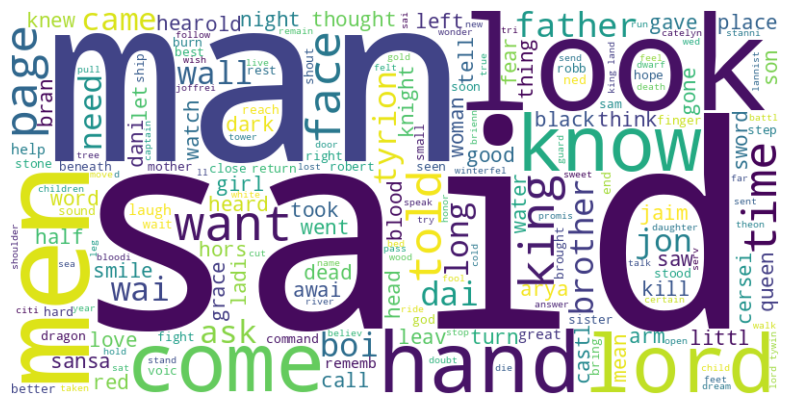

In [323]:
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, background_color="white").generate(' '.join([' '.join(words) for words in processed_story]))

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Model Building and training

In [225]:
model = gensim.models.Word2Vec(
    window=5, 
    sg=0,  # ({0, 1}, optional) – Training algorithm: 1 for skip-gram; otherwise CBOW
    min_count=5, 
    vector_size=100, 
    workers=4, 
    seed=1,
    compute_loss=True)

In [226]:
print(sorted([x for x in dir(model) if '_' not in x]))

['alpha', 'comment', 'epochs', 'hashfxn', 'hs', 'load', 'negative', 'random', 'sample', 'save', 'score', 'seed', 'sg', 'train', 'window', 'workers', 'wv']


In [227]:
for x in sorted([x for x in dir(model) if '_' not in x]):
    print(f'[+] {x:<15}: ', end=' ')
    a = [sorted([y for y in dir(x) if '_' not in y])]
    print(a)

[+] alpha          :  [['capitalize', 'casefold', 'center', 'count', 'encode', 'endswith', 'expandtabs', 'find', 'format', 'index', 'isalnum', 'isalpha', 'isascii', 'isdecimal', 'isdigit', 'isidentifier', 'islower', 'isnumeric', 'isprintable', 'isspace', 'istitle', 'isupper', 'join', 'ljust', 'lower', 'lstrip', 'maketrans', 'partition', 'replace', 'rfind', 'rindex', 'rjust', 'rpartition', 'rsplit', 'rstrip', 'split', 'splitlines', 'startswith', 'strip', 'swapcase', 'title', 'translate', 'upper', 'zfill']]
[+] comment        :  [['capitalize', 'casefold', 'center', 'count', 'encode', 'endswith', 'expandtabs', 'find', 'format', 'index', 'isalnum', 'isalpha', 'isascii', 'isdecimal', 'isdigit', 'isidentifier', 'islower', 'isnumeric', 'isprintable', 'isspace', 'istitle', 'isupper', 'join', 'ljust', 'lower', 'lstrip', 'maketrans', 'partition', 'replace', 'rfind', 'rindex', 'rjust', 'rpartition', 'rsplit', 'rstrip', 'split', 'splitlines', 'startswith', 'strip', 'swapcase', 'title', 'translate

In [228]:
model.build_vocab(processed_story)

In [229]:
vocab = model.wv.index_to_key

In [230]:
print(vocab[:random.randint(a=0, b=len(vocab))][:20])

['said', 'lord', 'ser', 'man', 'hand', 'like', 'men', 'king', 'look', 'jon', 'know', 'come', 'old', 'time', 'face', 'father', 'want', 'tyrion', 'brother', 'black']


In [231]:
model.epochs, model.wv.vector_size

(5, 100)

In [232]:
model.train(processed_story, total_examples=model.corpus_count, epochs=3)

(150000, 2411499)

In [233]:
print(sorted([x for x in dir(model.wv) if '_' not in x]))

['distance', 'distances', 'expandos', 'index2entity', 'index2word', 'load', 'norms', 'rank', 'save', 'similarity', 'vectors', 'vocab', 'wmdistance']


In [234]:
for x in sorted([x for x in dir(model.wv) if '_' not in x]):
    print(f'[+] {x:<15}: ', end=' ')
    a = [sorted([y for y in dir(x) if '_' not in y])]
    print(a)

[+] distance       :  [['capitalize', 'casefold', 'center', 'count', 'encode', 'endswith', 'expandtabs', 'find', 'format', 'index', 'isalnum', 'isalpha', 'isascii', 'isdecimal', 'isdigit', 'isidentifier', 'islower', 'isnumeric', 'isprintable', 'isspace', 'istitle', 'isupper', 'join', 'ljust', 'lower', 'lstrip', 'maketrans', 'partition', 'replace', 'rfind', 'rindex', 'rjust', 'rpartition', 'rsplit', 'rstrip', 'split', 'splitlines', 'startswith', 'strip', 'swapcase', 'title', 'translate', 'upper', 'zfill']]
[+] distances      :  [['capitalize', 'casefold', 'center', 'count', 'encode', 'endswith', 'expandtabs', 'find', 'format', 'index', 'isalnum', 'isalpha', 'isascii', 'isdecimal', 'isdigit', 'isidentifier', 'islower', 'isnumeric', 'isprintable', 'isspace', 'istitle', 'isupper', 'join', 'ljust', 'lower', 'lstrip', 'maketrans', 'partition', 'replace', 'rfind', 'rindex', 'rjust', 'rpartition', 'rsplit', 'rstrip', 'split', 'splitlines', 'startswith', 'strip', 'swapcase', 'title', 'translate

### Testing the Model

In [271]:
# Most Similar

for x in random.choices(vocab, k=20):
    print(f"[+] {x:<20}: ", end='')
    print([(x[0], round(x[1], 3)) for x in model.wv.most_similar(x)[:3]])

[+] determin            : [('tyrel', 0.782), ('innoc', 0.782), ('second', 0.782)]
[+] skirt               : [('bank', 0.633), ('rosei', 0.632), ('mast', 0.632)]
[+] horsehair           : [('asshai', 0.451), ('nearbi', 0.422), ('mead', 0.42)]
[+] meati               : [('sadli', 0.353), ('burnish', 0.342), ('glower', 0.34)]
[+] deepwood’           : [('baratheon’', 0.343), ('unwari', 0.334), ('“call', 0.315)]
[+] hopelessli          : [('aron', 0.348), ('weaver', 0.341), ('“more', 0.33)]
[+] muss                : [('finest', 0.556), ('scatter', 0.552), ('cask', 0.549)]
[+] gown                : [('captain', 0.949), ('“the', 0.949), ('strong', 0.948)]
[+] “them               : [('cricket', 0.321), ('scorch', 0.32), ('“whatev', 0.303)]
[+] lemonwood           : [('pureborn', 0.314), ('“hizdahr', 0.31), ('peas', 0.303)]
[+] healer              : [('weari', 0.414), ('recogn', 0.413), ('loosen', 0.405)]
[+] aton                : [('“fool', 0.401), ('throng', 0.373), ('barristan’', 0.329)]
[+

In [272]:
# Odd one out

model.wv.doesnt_match(['cersei', 'jaime', 'bronn', 'tyrion'])

'bronn'

In [275]:
# Similarity Score

print(model.wv.similarity('cersei', 'sansa'))
print(model.wv.similarity('tywin', 'sansa'))

0.9963587
0.99157673


In [273]:
model.wv['king'].shape

(100,)

In [279]:
model.wv['king']

array([-0.03320078,  0.18398415,  0.14548257,  0.14306906,  0.07961684,
       -0.43782485,  0.15624227,  0.42916587, -0.11988068, -0.20043363,
       -0.18107192, -0.4357351 , -0.02439388,  0.17394395,  0.07611237,
       -0.06777605, -0.02730307, -0.28160688, -0.00336245, -0.38645566,
        0.23551743,  0.07349356,  0.0686207 , -0.1796613 , -0.06930547,
        0.08353739, -0.14357758, -0.21105833, -0.12884021,  0.0419633 ,
        0.22010988,  0.00479392,  0.055569  , -0.07124173, -0.03566111,
        0.15037811,  0.10559031, -0.16245905, -0.13200366, -0.34941548,
        0.1742681 , -0.20067523, -0.19679835, -0.03985564,  0.15602496,
       -0.15117152, -0.18593615, -0.08425422,  0.10758983,  0.12506425,
       -0.11169463, -0.3084764 ,  0.06038878,  0.01019615, -0.31231058,
        0.1705078 ,  0.08459406, -0.01634323, -0.18012437,  0.12693629,
       -0.01575032,  0.12518743, -0.05186048, -0.08947825, -0.33908868,
        0.19895658,  0.08922864,  0.20821379, -0.36254576,  0.32

### Get most important words from the model

In [237]:
data = [(v, model.wv[v].sum()) for v in vocab]

In [238]:
df = pd.DataFrame(data, columns=['words', 'vector_sum'])

In [239]:
df.sort_values(by=['vector_sum'], ascending=False).head(20)

,words,vector_sum
837,highgarden,0.197702
7902,brilliant,0.185008
1617,mott,0.182093
3608,separ,0.181634
1100,volanti,0.176261
4557,aim,0.176112
6015,burgundi,0.174572
5976,speechless,0.172557
2771,“ladi,0.172157
7113,hinterland,0.168758


In [240]:
df.sort_values(by=['vector_sum'], ascending=True).head(20)

,words,vector_sum
0,said,-0.565011
5,like,-0.560982
15,father,-0.518412
27,long,-0.484233
4,hand,-0.481428
8,look,-0.471990
30,red,-0.444993
11,come,-0.444137
19,black,-0.443056
3,man,-0.440693


### Visualisation of vectors

In [287]:
x = model.wv.get_normed_vectors()

In [288]:
y = vocab

#### 2D

In [305]:
pca = PCA(n_components=2)
X = pca.fit_transform(x)

In [307]:
df = pd.DataFrame(data=X, columns=['x', 'y'])
df['key'] = y
df['val_sum'] = df['x'] + df['y']
df = df.sort_values(by=['val_sum'], ascending=False)

In [309]:
fig = px.scatter(df, x='x', y='y', color='key')
fig.show()

In [310]:
fig = px.scatter(df.head(1000), x='x', y='y', color='key')
fig.show()

In [311]:
fig = px.scatter(df.tail(1000), x='x', y='y', color='key')
fig.show()

#### 3D

In [313]:
pca = PCA(n_components=3)
X = pca.fit_transform(x)

In [314]:
df = pd.DataFrame(data=X, columns=['x', 'y', 'z'])
df['key'] = y
df['val_sum'] = df['x'] + df['y'] + df['z']
df = df.sort_values(by=['val_sum'], ascending=False)

In [315]:
fig = px.scatter_3d(df.head(100), x='x', y='y', z='z', color='key')
fig.show()

In [316]:
fig = px.scatter_3d(df.tail(100), x='x', y='y', z='z', color='key')
fig.show()